<a href="https://colab.research.google.com/github/ZahraReyhanian/DGM/blob/main/GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<div style="display:block" direction=rtl align=right><br><br>
    <div  style="width:100%;margin:100;display:block"  display=block align=center>
        <img width=130 align=right src="https://i.ibb.co/yXKQmtZ/logo1.png" style="margin:0;" />
        <img width=170 align=left  src="https://i.ibb.co/wLjqFkw/logo2.png" style="margin:0;" />
        <span><br><font size=5>University of Tehran , school of ECE</font></span>
        <span><br><font size=3>Deep Generative Models Course</font></span>
        <span><br><font size=3>Fall 2023</font></span>
    </div><br><br><br>
    <div style="display:block" align=left display=block>
        <font size=3>Homework 2 - Part 2</font><br>
        <hr />
        <font size=3>TA: <a href="mailto:p.zilouchian@ut.ac.ir">Parham Zilouchian</a><br></font><br>
        <font size=3>TA: <a href="mailto:alirezaghafouri@ut.ac.ir">Alireza Ghafouri</a><br></font><br>
        
    </div>
</div>

# Working with GANs using PyTorch

This notebook is a homework assignment for the Deep Generative Models course at the University of Tehran. The goal of this assignment is to get familiar with the concept of Generative Adversarial Networks (GANs) and how to implement it with PyTorch. We will use the MNIST dataset for this assignment.

---


**Requisites**

*   Python 3.x
*   Jupyter
*   PyTorch >= 1.8
*   NumPy
*   Matplotlib
---

In [ ]:
import torch
torch.__version__

'2.1.0+cu121'

In [ ]:
#install torcheval to compute FID score
!pip install torcheval-nightly

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.8/190.8 kB 2.3 MB/s eta 0:00:00


In [ ]:
!free -m
!df -h
!nvidia-smi

               total        used        free      shared  buff/cache   available
Mem:           12978        1026        7432           1        4519       11657
Swap:              0           0           0
Filesystem      Size  Used Avail Use% Mounted on
overlay          79G   27G   52G  34% /
tmpfs            64M     0   64M   0% /dev
shm             5.7G     0  5.7G   0% /dev/shm
/dev/root       2.0G  1.1G  849M  57% /usr/sbin/docker-init
/dev/sda1        75G   58G   18G  77% /opt/bin/.nvidia
tmpfs           6.4G  136K  6.4G   1% /var/colab
tmpfs           6.4G     0  6.4G   0% /proc/acpi
tmpfs           6.4G     0  6.4G   0% /proc/scsi
tmpfs           6.4G     0  6.4G   0% /sys/firmware
Mon Dec 18 13:24:44 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------

# **Import Libraries:**

Import your required libraries!

In [ ]:
import torch
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
import torchvision

import argparse
import numpy as np
import os
from torch.nn import functional as F
from torchvision.utils import save_image
from tqdm import tqdm
import torchvision.utils as vutils

from torch import autograd, nn, optim
from torch.distributions.normal import Normal

import argparse
from pprint import pprint
from torchvision import datasets, transforms
import PIL.Image as Image
# from pytorch_fid import fid_score
from torcheval.metrics import FrechetInceptionDistance

In [ ]:
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu");
torch.manual_seed(77)

## **Downloading the dataset:**

We will use the MNIST dataset for this assignment. The dataset is already available in PyTorch, so we just need to download it.

In [ ]:
preprocess = transforms.ToTensor()
batch_size = 64

train_loader = torch.utils.data.DataLoader(
            datasets.MNIST(root='./data', train=True, download=True, transform=preprocess),
            batch_size=batch_size,
            shuffle=True
        )
test_loader = torch.utils.data.DataLoader(
            datasets.MNIST(root='./data', train=False, download=True, transform=preprocess),
            batch_size=batch_size,
            shuffle=True
        )

# Create pre-processed training and test sets
X_train = train_loader.dataset.train_data.to(device).float() / 255
y_train = train_loader.dataset.train_labels.to(device)
X_test = test_loader.dataset.test_data.to(device).float() / 255
y_test = test_loader.dataset.test_labels.to(device)

print('Train dataset shape: ', X_train.data.shape)
print('Test dataset shape: ', X_test.data.shape)

100%|██████████| 9912422/9912422 [00:00<00:00, 236118305.57it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 37997394.55it/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 69346843.91it/s]

Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw


100%|██████████| 4542/4542 [00:00<00:00, 10787388.88it/s]


Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



/usr/local/lib/python3.10/dist-packages/torchvision/datasets/mnist.py:75: UserWarning: train_data has been renamed data
  warnings.warn("train_data has been renamed data")


Train dataset shape:  torch.Size([60000, 28, 28])
Test dataset shape:  torch.Size([10000, 28, 28])


/usr/local/lib/python3.10/dist-packages/torchvision/datasets/mnist.py:65: UserWarning: train_labels has been renamed targets
  warnings.warn("train_labels has been renamed targets")
/usr/local/lib/python3.10/dist-packages/torchvision/datasets/mnist.py:80: UserWarning: test_data has been renamed data
  warnings.warn("test_data has been renamed data")
/usr/local/lib/python3.10/dist-packages/torchvision/datasets/mnist.py:70: UserWarning: test_labels has been renamed targets
  warnings.warn("test_labels has been renamed targets")


In [ ]:
class Reshape(torch.nn.Module):
    def __init__(self, *shape):
        super().__init__()
        self.shape = shape
    def forward(self, x):
        return x.reshape(x.size(0), *self.shape)


class ReLU(torch.nn.Module):
    def __init__(self):
        super().__init__()
    def forward(self, x):
        return torch.maximum(x, torch.zeros_like(x))

In [ ]:
def interpolate(batch):
    arr = []
    for img in batch:
        pil_img = transforms.ToPILImage()(img)
        resized_img = pil_img.resize((299,299), Image.BILINEAR)
        arr.append(transforms.ToTensor()(resized_img))
    return torch.stack(arr)

## **Define Generator:**

We will use a simple 5-layer convolutional neural network for this assignment. The network is defined in the `Net` class below. The network is composed of 3 convolutional layers and 2 fully connected layers.

In [ ]:
class Generator(torch.nn.Module):
    def __init__(self, z_dim=64, num_channels=1):
        super().__init__()
        self.z_dim = z_dim

        ############################# TODO #############################
        # Complete this part according to the introduced generator table on the provided manuscript!

        # YOUR CODE STARTS HERE
        self.net = nn.Sequential(
            nn.Linear(z_dim, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Linear(512, 64 * 7 * 7),
            nn.BatchNorm1d(64 * 7 * 7),
            nn.ReLU(),
            Reshape(64, 7, 7),
            nn.PixelShuffle(2),

            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.PixelShuffle(2),
            nn.Conv2d(in_channels=8, out_channels=1, kernel_size=3, padding=1)
        )

        # YOUR CODE ENDS HERE

    def forward(self, z):
        return self.net(z)

## **Define Discriminator:**

We will use a simple 5-layer convolutional neural network for this assignment. The network is defined in the `Net` class below. The network is composed of 3 convolutional layers and 2 fully connected layers.

In [ ]:
class Discriminator(torch.nn.Module):
    def __init__(self, num_channels=1):
        super().__init__()

        ############################# TODO #############################
        # Complete this part according to the introduced discriminator table on the provided manuscript!

        # YOUR CODE STARTS HERE
        self.net = nn.Sequential(
            nn.Conv2d(in_channels=1, out_channels=32, kernel_size=4, padding=1, stride=2),
            nn.ReLU(),
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=4, padding=1, stride=2),
            nn.ReLU(),
            Reshape(64*7*7),
            nn.Linear(64*7*7, 512),
            nn.ReLU(),
            nn.Linear(512, 1),
            Reshape()
        )

        # YOUR CODE ENDS HERE

    def forward(self, x):
        return self.net(x)

## **Define Your GAN:**

In [ ]:
class GAN(nn.Module):
    def __init__(self, z_dim=2):
        super().__init__()
        self.z_dim = z_dim
        self.g = Generator(z_dim=z_dim)
        self.d = Discriminator()   # note that discriminator outputs logits

    def discriminator_loss(self, x_real, x_fake, *, device):
        '''
        Input Arguments:

        - x_real (torch.Tensor): training data samples (64, 1, 28, 28)
        - x_fake (torch.Tensor): generated x (64, 1, 28, 28)
        - device (torch.device): 'cpu' by default

        Returns:
        - d_loss (torch.Tensor): nonsaturating discriminator loss
        '''

        ############################# TODO #############################
        # YOUR CODE STARTS HERE

        dz = self.d(x_fake)
        dx = self.d(x_real)

        real_label = torch.ones(x_real.shape[0], device=device)
        fake_label = torch.zeros(x_real.shape[0], device=device)

        bce_loss = F.binary_cross_entropy_with_logits

        d_loss = bce_loss(dx, real_label).mean() + bce_loss(dz, fake_label).mean()
        # YOUR CODE ENDS HERE


        return d_loss

    def generator_loss(self, x_fake, *, device):
        '''
        Input Arguments:
        - x_fake (torch.Tensor): generated x (64, 1, 28, 28)
        - device (torch.device): 'cpu' by default

        Returns:
        - g_loss (torch.Tensor): nonsaturating generator loss
        '''

        ############################# TODO #############################
        # YOUR CODE STARTS HERE
        dgz = self.d(x_fake)

        g_loss = -F.logsigmoid(dgz).mean()
        # YOUR CODE ENDS HERE


        return g_loss


## **Training Process:**

In [ ]:
from pickle import GLOBAL

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
fid_values = []

class Trainer:
    def __init__(self,
                 model,
                 optimizers,
                 device="cuda",
                 iter_max=10000,
                 iter_save=1000,
                 num_latents=100,
                 out_dir=""
            ):
        self.model = model
        self.optimizers = optimizers
        self.device = device
        self.iter_save = iter_save
        self.iter_max = iter_max
        self.out_dir = out_dir
        self.num_latents = num_latents


        # fix visualization latents
        self.z_test = torch.randn(100, self.num_latents).to(device)


    def build_input(self, x, y):
        x_real = x.to(self.device)
        y_real = y.to(self.device)
        return x_real, y_real

    def viz(self, global_step=1):
        with torch.no_grad():
            generator = self.model.g
            generator.eval()
            ############
            fake = ((generator(self.z_test) + 1) / 2.) #.detach().cpu()
            ###############
            generator.train()
        torchvision.utils.save_image(fake, '%s/fake_%04d.png' % (self.out_dir, global_step), nrow=10, padding=2, normalize=True)
        img_list.append(vutils.make_grid(fake, padding=2, normalize=True, nrow=10))


    def checkpoint_and_log(self, global_step):
        if global_step % self.iter_save == 0:
            with torch.no_grad():
                self.viz(global_step)
                torch.save((self.model.g, self.model.d), '%s/model_%04d.pt' % (self.out_dir, global_step))

    def gan_step(self, x_real, y_real, global_step):
        assert len(self.optimizers) == 2
        ############################# TODO #############################
        # Here you should calculate the loss for both the generator and discriminator parts!
        # After that, you have to apply this calculated loss to both the networks and update their weights respectively.
        # Here you have to use the "checkpoint_and_log" function in order to visualize and make checkpoint from your model!

        # YOUR CODE STARTS HERE
        z = torch.randn(x_real.shape[0], self.model.g.z_dim, device=self.device)

        #generate fake x
        x_fake = self.model.g(z)

        #calculate generator loss
        g_loss = self.model.generator_loss(x_fake, device=self.device)

        #backpropation and optimize parameters of generator
        self.optimizers[0].zero_grad()
        g_loss.backward()
        self.optimizers[0].step()

        #calculate discriminator loss
        d_loss = self.model.discriminator_loss(x_real, x_fake.detach(), device=self.device)

        #backpropation and optimize parameters of discriminator
        self.optimizers[1].zero_grad()
        d_loss.backward()
        self.optimizers[1].step()


        D_losses.append(d_loss.item())
        G_losses.append(g_loss.item())

        self.checkpoint_and_log(global_step)

        # YOUR CODE ENDS HERE

        return x_fake, d_loss.item(), g_loss.item()

    def compute_fid(self, x_real, x_fake):
        fid = FrechetInceptionDistance(device=self.device)

        x_real3 = x_real.repeat(1, 3, 1, 1)

        # I used sigmoid to make images between [0,1]
        x_fake3 = F.sigmoid(x_fake).repeat(1, 3, 1, 1)

        #calculate FID score
        fid.update(x_real3, is_real=True)
        fid.update(x_fake3, is_real=False)
        fid_value = fid.compute()

        fid_values.append(fid_value.item())

        return fid_value.item()

    def train(self, train_loader, reinit=False):
        global_step = 0

        # train model from scratch
        if reinit:
            ############################# TODO #############################
            # OPTIONAL: Here you can Initialize your model if you want!

            # YOUR CODE STARTS HERE

            self.model = GAN()

            # YOUR CODE ENDS HERE
            pass

        # train models for multiple epochs
        with tqdm(total=int(self.iter_max)) as pbar:
            ############################# TODO #############################
            # Here is your training loop!
            # YOUR CODE STARTS HERE
            while global_step < self.iter_max:
                for idx, (x, y) in enumerate(train_loader):
                    x_real, y_real = self.build_input(x, y)

                    x_fake, d_loss, g_loss = self.gan_step(x_real, y_real, global_step)

                    global_step += 1
                    pbar.update(1)

                    if global_step % 100 == 0:
                        fid_value = self.compute_fid(x_real, x_fake)
                        print("\n-----------step", global_step, "-----------")
                        self.viz(global_step=global_step)
                        print("\td loss :", d_loss)
                        print("\tg loss :", g_loss)
                        print("\tfid :", fid_value)

                    if global_step > self.iter_max:
                      break

            # YOUR CODE ENDS HERE

    def generate_pic(self, num):
        generated_images = []
        for i in range(num):
            with torch.no_grad():
                z = torch.randn(64, self.model.g.z_dim, device=device)
                x_fake = self.model.g(z)
                generated_images.append(x_fake)

        return generated_images




In [ ]:
def build_model(device='cpu', num_latents=64):
    model = GAN(z_dim=num_latents)
    return model.to(device)


def build_optimizers(model):
    g_opt = torch.optim.Adam(model.g.parameters(), lr=1e-3)
    d_opt = torch.optim.Adam(model.d.parameters(), lr=1e-3)
    optimizers = [g_opt, d_opt]
    return optimizers


num_latents = 64
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = build_model(device, num_latents=num_latents)
optimizers = build_optimizers(model)
iter_max = 10000

trainer = Trainer(model, optimizers,
                    device=device,
                    iter_max=iter_max,
                    num_latents=num_latents,
                    out_dir='./'
                  )

trainer.train(train_loader)

trainer.viz()

  1%|          | 94/10000 [00:03<02:45, 59.93it/s]Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth

  0%|          | 0.00/104M [00:00<?, ?B/s]
  8%|▊         | 8.27M/104M [00:00<00:01, 86.2MB/s]
 16%|█▌        | 16.5M/104M [00:00<00:01, 77.0MB/s]
 23%|██▎       | 23.9M/104M [00:00<00:01, 73.2MB/s]
 31%|███       | 31.8M/104M [00:00<00:00, 76.6MB/s]
 38%|███▊      | 39.8M/104M [00:00<00:00, 79.1MB/s]
 46%|████▌     | 47.7M/104M [00:00<00:00, 80.5MB/s]
 53%|█████▎    | 55.5M/104M [00:00<00:00, 79.4MB/s]
 61%|██████    | 63.1M/104M [00:00<00:00, 79.3MB/s]
 68%|██████▊   | 70.6M/104M [00:00<00:00, 77.9MB/s]
 76%|███████▌  | 78.7M/104M [00:01<00:00, 79.7MB/s]
 83%|████████▎ | 86.3M/104M [00:01<00:00, 76.5MB/s]
 90%|█████████ | 93.6M/104M [00:01<00:00, 70.5MB/s]
100%|██████████| 104M/104M [00:01<00:00, 76.3MB/s]
  1%|          | 101/10000 [00:13<1:13:48,  2.24it/s]


-----------step 100 -----------
	d loss : 0.09097494184970856
	g loss : 4.349872589111328
	fid : 304.93487548828125


  2%|▏         | 200/10000 [00:16<04:32, 35.91it/s]


-----------step 200 -----------
	d loss : 0.23940208554267883
	g loss : 6.095428943634033
	fid : 256.4981384277344


  3%|▎         | 307/10000 [00:31<38:23,  4.21it/s]  


-----------step 300 -----------
	d loss : 0.2693193852901459
	g loss : 3.575981855392456
	fid : 207.2964324951172


  4%|▍         | 409/10000 [00:36<21:11,  7.55it/s]


-----------step 400 -----------
	d loss : 0.18380263447761536
	g loss : 3.416084051132202
	fid : 224.65309143066406


  5%|▌         | 504/10000 [00:42<42:11,  3.75it/s]


-----------step 500 -----------
	d loss : 0.1858469396829605
	g loss : 5.920384883880615
	fid : 173.16934204101562


  6%|▌         | 607/10000 [00:47<19:47,  7.91it/s]


-----------step 600 -----------
	d loss : 0.5299680233001709
	g loss : 5.848150253295898
	fid : 184.347900390625


  7%|▋         | 703/10000 [00:54<41:40,  3.72it/s]


-----------step 700 -----------
	d loss : 0.20535126328468323
	g loss : 4.575734615325928
	fid : 184.77816772460938


  8%|▊         | 804/10000 [00:59<26:47,  5.72it/s]


-----------step 800 -----------
	d loss : 0.1151222288608551
	g loss : 6.38668966293335
	fid : 183.30230712890625


  9%|▉         | 906/10000 [01:05<21:23,  7.09it/s]


-----------step 900 -----------
	d loss : 0.30291101336479187
	g loss : 4.961764335632324
	fid : 176.09426879882812


 10%|█         | 1005/10000 [01:11<35:01,  4.28it/s]


-----------step 1000 -----------
	d loss : 0.4233238101005554
	g loss : 2.4517035484313965
	fid : 158.3213653564453


 11%|█         | 1106/10000 [01:16<25:56,  5.71it/s]


-----------step 1100 -----------
	d loss : 0.3566701114177704
	g loss : 3.65309476852417
	fid : 158.68222045898438


 12%|█▏        | 1208/10000 [01:22<21:55,  6.68it/s]


-----------step 1200 -----------
	d loss : 0.13482075929641724
	g loss : 4.48231315612793
	fid : 165.69052124023438


 13%|█▎        | 1308/10000 [01:27<20:31,  7.06it/s]


-----------step 1300 -----------
	d loss : 0.2434053122997284
	g loss : 2.8575429916381836
	fid : 153.66189575195312


 14%|█▍        | 1403/10000 [01:34<32:04,  4.47it/s]


-----------step 1400 -----------
	d loss : 0.17237168550491333
	g loss : 4.66755485534668
	fid : 166.6249542236328


 15%|█▌        | 1506/10000 [01:39<25:37,  5.52it/s]


-----------step 1500 -----------
	d loss : 0.4365851581096649
	g loss : 3.776125907897949
	fid : 140.15908813476562


 16%|█▌        | 1607/10000 [01:45<20:06,  6.96it/s]


-----------step 1600 -----------
	d loss : 0.5217843055725098
	g loss : 3.544428586959839
	fid : 159.98443603515625


 17%|█▋        | 1710/10000 [01:51<23:31,  5.87it/s]


-----------step 1700 -----------
	d loss : 0.31259047985076904
	g loss : 2.6415762901306152
	fid : 162.8921661376953


 18%|█▊        | 1805/10000 [01:56<22:42,  6.01it/s]


-----------step 1800 -----------
	d loss : 0.5413575172424316
	g loss : 5.099936008453369
	fid : 145.8012237548828


 19%|█▉        | 1904/10000 [02:02<31:32,  4.28it/s]


-----------step 1900 -----------
	d loss : 0.568009078502655
	g loss : 1.9969496726989746
	fid : 155.036865234375


 20%|██        | 2006/10000 [02:07<24:11,  5.51it/s]


-----------step 2000 -----------
	d loss : 0.5361323356628418
	g loss : 2.4216508865356445
	fid : 144.08506774902344


 21%|██        | 2107/10000 [02:13<20:56,  6.28it/s]


-----------step 2100 -----------
	d loss : 0.41595813632011414
	g loss : 4.638418197631836
	fid : 145.74752807617188


 22%|██▏       | 2207/10000 [02:19<20:50,  6.23it/s]


-----------step 2200 -----------
	d loss : 0.30596229434013367
	g loss : 2.6297922134399414
	fid : 154.5907440185547


 23%|██▎       | 2306/10000 [02:25<20:01,  6.41it/s]


-----------step 2300 -----------
	d loss : 0.2744606137275696
	g loss : 2.870405912399292
	fid : 142.64920043945312


 24%|██▍       | 2404/10000 [02:31<32:40,  3.88it/s]


-----------step 2400 -----------
	d loss : 0.18778039515018463
	g loss : 4.402935028076172
	fid : 156.78285217285156


 25%|██▌       | 2507/10000 [02:36<21:32,  5.80it/s]


-----------step 2500 -----------
	d loss : 0.23627236485481262
	g loss : 2.754530906677246
	fid : 144.8813934326172


 26%|██▌       | 2605/10000 [02:42<27:51,  4.42it/s]


-----------step 2600 -----------
	d loss : 0.2215246856212616
	g loss : 3.1526286602020264
	fid : 134.9574737548828


 27%|██▋       | 2708/10000 [02:48<16:56,  7.17it/s]


-----------step 2700 -----------
	d loss : 0.4074704945087433
	g loss : 4.993041038513184
	fid : 142.6094970703125


 28%|██▊       | 2806/10000 [02:54<19:42,  6.08it/s]


-----------step 2800 -----------
	d loss : 0.3099108934402466
	g loss : 2.6568424701690674
	fid : 142.20156860351562


 29%|██▉       | 2908/10000 [02:59<15:45,  7.50it/s]


-----------step 2900 -----------
	d loss : 0.23724901676177979
	g loss : 2.9746105670928955
	fid : 133.60215759277344


 30%|███       | 3004/10000 [03:04<20:33,  5.67it/s]


-----------step 3000 -----------
	d loss : 0.6045022010803223
	g loss : 2.2893619537353516
	fid : 148.26431274414062


 31%|███       | 3109/10000 [03:10<19:53,  5.77it/s]


-----------step 3100 -----------
	d loss : 0.2762072682380676
	g loss : 3.5187811851501465
	fid : 140.173095703125


 32%|███▏      | 3210/10000 [03:16<14:46,  7.66it/s]


-----------step 3200 -----------
	d loss : 0.3441316485404968
	g loss : 5.129988670349121
	fid : 140.35647583007812


 33%|███▎      | 3304/10000 [03:21<25:35,  4.36it/s]


-----------step 3300 -----------
	d loss : 0.1906580924987793
	g loss : 4.161886692047119
	fid : 136.92764282226562


 34%|███▍      | 3404/10000 [03:27<19:52,  5.53it/s]


-----------step 3400 -----------
	d loss : 0.18897172808647156
	g loss : 3.6251132488250732
	fid : 155.2486572265625


 35%|███▌      | 3507/10000 [03:33<21:16,  5.09it/s]


-----------step 3500 -----------
	d loss : 0.13391579687595367
	g loss : 4.392279148101807
	fid : 138.55760192871094


 36%|███▌      | 3605/10000 [03:38<18:40,  5.71it/s]


-----------step 3600 -----------
	d loss : 0.4125405251979828
	g loss : 3.882383346557617
	fid : 142.890869140625


 37%|███▋      | 3707/10000 [03:43<18:30,  5.67it/s]


-----------step 3700 -----------
	d loss : 0.25043055415153503
	g loss : 4.64100456237793
	fid : 145.37661743164062


 38%|███▊      | 3804/10000 [03:49<26:23,  3.91it/s]


-----------step 3800 -----------
	d loss : 0.41308891773223877
	g loss : 3.9750754833221436
	fid : 134.32400512695312


 39%|███▉      | 3905/10000 [03:55<17:42,  5.74it/s]


-----------step 3900 -----------
	d loss : 0.10707555711269379
	g loss : 3.9872887134552
	fid : 132.54342651367188


 40%|████      | 4003/10000 [04:01<22:26,  4.45it/s]


-----------step 4000 -----------
	d loss : 0.1781720370054245
	g loss : 3.656076669692993
	fid : 132.47438049316406


 41%|████      | 4108/10000 [04:06<13:44,  7.15it/s]


-----------step 4100 -----------
	d loss : 0.192315936088562
	g loss : 4.4133501052856445
	fid : 131.3009490966797


 42%|████▏     | 4206/10000 [04:12<15:56,  6.06it/s]


-----------step 4200 -----------
	d loss : 0.17268693447113037
	g loss : 4.047181129455566
	fid : 133.89593505859375


 43%|████▎     | 4309/10000 [04:18<12:38,  7.50it/s]


-----------step 4300 -----------
	d loss : 0.23692762851715088
	g loss : 4.065304756164551
	fid : 136.2459259033203


 44%|████▍     | 4405/10000 [04:23<17:43,  5.26it/s]


-----------step 4400 -----------
	d loss : 0.23198279738426208
	g loss : 3.541721820831299
	fid : 125.83857727050781


 45%|████▌     | 4507/10000 [04:29<15:14,  6.01it/s]


-----------step 4500 -----------
	d loss : 0.3372872769832611
	g loss : 2.5573816299438477
	fid : 134.8798065185547


 46%|████▌     | 4609/10000 [04:34<11:47,  7.62it/s]


-----------step 4600 -----------
	d loss : 0.3789704442024231
	g loss : 2.601304531097412
	fid : 132.21551513671875


 47%|████▋     | 4706/10000 [04:40<19:03,  4.63it/s]


-----------step 4700 -----------
	d loss : 0.25226151943206787
	g loss : 3.019211769104004
	fid : 132.78892517089844


 48%|████▊     | 4806/10000 [04:46<15:26,  5.61it/s]


-----------step 4800 -----------
	d loss : 0.3580753207206726
	g loss : 3.2751097679138184
	fid : 146.4429473876953


 49%|████▉     | 4905/10000 [04:52<18:59,  4.47it/s]


-----------step 4900 -----------
	d loss : 0.389470636844635
	g loss : 2.8053457736968994
	fid : 127.34088134765625


 50%|█████     | 5003/10000 [04:57<14:25,  5.77it/s]


-----------step 5000 -----------
	d loss : 0.2905728220939636
	g loss : 2.992593765258789
	fid : 123.52259826660156


 51%|█████     | 5105/10000 [05:03<14:55,  5.46it/s]


-----------step 5100 -----------
	d loss : 0.2660330832004547
	g loss : 3.7429399490356445
	fid : 133.65365600585938


 52%|█████▏    | 5207/10000 [05:08<12:46,  6.25it/s]


-----------step 5200 -----------
	d loss : 0.29179105162620544
	g loss : 2.210991621017456
	fid : 144.65951538085938


 53%|█████▎    | 5304/10000 [05:13<13:04,  5.99it/s]


-----------step 5300 -----------
	d loss : 0.3263418674468994
	g loss : 2.906156063079834
	fid : 136.300048828125


 54%|█████▍    | 5406/10000 [05:19<14:24,  5.31it/s]


-----------step 5400 -----------
	d loss : 0.49763983488082886
	g loss : 4.129829406738281
	fid : 131.54884338378906


 55%|█████▌    | 5507/10000 [05:24<09:23,  7.97it/s]


-----------step 5500 -----------
	d loss : 0.5008275508880615
	g loss : 4.217818260192871
	fid : 119.91677856445312


 56%|█████▌    | 5607/10000 [05:30<10:27,  7.00it/s]


-----------step 5600 -----------
	d loss : 0.23222312331199646
	g loss : 2.7804174423217773
	fid : 133.7786865234375


 57%|█████▋    | 5709/10000 [05:36<12:12,  5.86it/s]


-----------step 5700 -----------
	d loss : 0.34714365005493164
	g loss : 2.5034515857696533
	fid : 126.85468292236328


 58%|█████▊    | 5805/10000 [05:41<11:54,  5.87it/s]


-----------step 5800 -----------
	d loss : 0.5239866971969604
	g loss : 2.9119186401367188
	fid : 120.26994323730469


 59%|█████▉    | 5907/10000 [05:47<11:56,  5.71it/s]


-----------step 5900 -----------
	d loss : 0.48383742570877075
	g loss : 3.2878150939941406
	fid : 131.98373413085938


 60%|██████    | 6004/10000 [05:52<11:23,  5.85it/s]


-----------step 6000 -----------
	d loss : 0.221547469496727
	g loss : 3.556595802307129
	fid : 139.18478393554688


 61%|██████    | 6106/10000 [05:58<09:34,  6.78it/s]


-----------step 6100 -----------
	d loss : 0.3875654637813568
	g loss : 2.7590839862823486
	fid : 126.32642364501953


 62%|██████▏   | 6206/10000 [06:03<09:41,  6.52it/s]


-----------step 6200 -----------
	d loss : 0.4423646330833435
	g loss : 2.152848243713379
	fid : 126.92377471923828


 63%|██████▎   | 6302/10000 [06:09<10:49,  5.69it/s]


-----------step 6300 -----------
	d loss : 0.6948344707489014
	g loss : 2.3693490028381348
	fid : 118.18627166748047


 64%|██████▍   | 6409/10000 [06:14<09:26,  6.34it/s]


-----------step 6400 -----------
	d loss : 0.21364030241966248
	g loss : 2.7838988304138184
	fid : 133.33316040039062


 65%|██████▌   | 6506/10000 [06:20<10:16,  5.67it/s]


-----------step 6500 -----------
	d loss : 0.12987902760505676
	g loss : 3.371319532394409
	fid : 133.0701904296875


 66%|██████▌   | 6607/10000 [06:25<10:52,  5.20it/s]


-----------step 6600 -----------
	d loss : 0.4719080328941345
	g loss : 3.917612314224243
	fid : 128.77059936523438


 67%|██████▋   | 6708/10000 [06:31<07:14,  7.58it/s]


-----------step 6700 -----------
	d loss : 0.3842093348503113
	g loss : 3.82002592086792
	fid : 130.05078125


 68%|██████▊   | 6805/10000 [06:36<09:30,  5.60it/s]


-----------step 6800 -----------
	d loss : 0.5679851174354553
	g loss : 5.154067516326904
	fid : 128.26071166992188


 69%|██████▉   | 6905/10000 [06:42<10:21,  4.98it/s]


-----------step 6900 -----------
	d loss : 0.4044840931892395
	g loss : 2.018601655960083
	fid : 137.04861450195312


 70%|███████   | 7007/10000 [06:47<06:40,  7.47it/s]


-----------step 7000 -----------
	d loss : 0.6963368058204651
	g loss : 3.38045072555542
	fid : 131.28271484375


 71%|███████   | 7110/10000 [06:53<08:02,  5.99it/s]


-----------step 7100 -----------
	d loss : 0.4865533709526062
	g loss : 2.0507636070251465
	fid : 134.62246704101562


 72%|███████▏  | 7210/10000 [06:58<05:46,  8.06it/s]


-----------step 7200 -----------
	d loss : 0.20471307635307312
	g loss : 5.142043113708496
	fid : 124.56676483154297


 73%|███████▎  | 7307/10000 [07:04<08:54,  5.03it/s]


-----------step 7300 -----------
	d loss : 0.4751819968223572
	g loss : 1.8871684074401855
	fid : 120.22547149658203


 74%|███████▍  | 7408/10000 [07:09<05:53,  7.34it/s]


-----------step 7400 -----------
	d loss : 0.3435296416282654
	g loss : 2.6261160373687744
	fid : 122.41648864746094


 75%|███████▌  | 7504/10000 [07:15<07:53,  5.27it/s]


-----------step 7500 -----------
	d loss : 0.49589431285858154
	g loss : 2.7700629234313965
	fid : 118.0323715209961


 76%|███████▌  | 7608/10000 [07:21<06:38,  6.00it/s]


-----------step 7600 -----------
	d loss : 0.3984980583190918
	g loss : 2.8199193477630615
	fid : 119.04495239257812


 77%|███████▋  | 7705/10000 [07:26<06:22,  6.00it/s]


-----------step 7700 -----------
	d loss : 0.6514220237731934
	g loss : 5.497034549713135
	fid : 125.48809814453125


 78%|███████▊  | 7807/10000 [07:32<05:43,  6.38it/s]


-----------step 7800 -----------
	d loss : 0.3060188293457031
	g loss : 2.942432403564453
	fid : 139.76028442382812


 79%|███████▉  | 7909/10000 [07:37<04:15,  8.19it/s]


-----------step 7900 -----------
	d loss : 0.5352373123168945
	g loss : 3.4116857051849365
	fid : 128.82623291015625


 80%|████████  | 8004/10000 [07:42<06:22,  5.22it/s]


-----------step 8000 -----------
	d loss : 0.42451879382133484
	g loss : 2.1006102561950684
	fid : 125.01741027832031


 81%|████████  | 8107/10000 [07:48<05:37,  5.61it/s]


-----------step 8100 -----------
	d loss : 1.0934261083602905
	g loss : 4.718045234680176
	fid : 122.39954376220703


 82%|████████▏ | 8208/10000 [07:53<03:54,  7.63it/s]


-----------step 8200 -----------
	d loss : 0.2855428457260132
	g loss : 3.5766348838806152
	fid : 119.4183120727539


 83%|████████▎ | 8307/10000 [07:59<04:44,  5.95it/s]


-----------step 8300 -----------
	d loss : 0.2772606611251831
	g loss : 2.5507307052612305
	fid : 123.24072265625


 84%|████████▍ | 8408/10000 [08:04<03:37,  7.34it/s]


-----------step 8400 -----------
	d loss : 0.16445204615592957
	g loss : 3.2272019386291504
	fid : 121.87617492675781


 85%|████████▌ | 8505/10000 [08:10<04:39,  5.36it/s]


-----------step 8500 -----------
	d loss : 0.35573557019233704
	g loss : 2.905263900756836
	fid : 120.32501983642578


 86%|████████▌ | 8608/10000 [08:15<03:18,  7.00it/s]


-----------step 8600 -----------
	d loss : 0.4999247193336487
	g loss : 2.7276344299316406
	fid : 129.1980743408203


 87%|████████▋ | 8704/10000 [08:21<04:01,  5.36it/s]


-----------step 8700 -----------
	d loss : 0.31178903579711914
	g loss : 2.361438751220703
	fid : 118.56241607666016


 88%|████████▊ | 8806/10000 [08:26<03:04,  6.46it/s]


-----------step 8800 -----------
	d loss : 0.5244715213775635
	g loss : 2.2610042095184326
	fid : 126.06901550292969


 89%|████████▉ | 8908/10000 [08:32<02:26,  7.48it/s]


-----------step 8900 -----------
	d loss : 0.14303168654441833
	g loss : 7.565298080444336
	fid : 120.00967407226562


 90%|█████████ | 9004/10000 [08:37<03:25,  4.84it/s]


-----------step 9000 -----------
	d loss : 0.348117470741272
	g loss : 2.0511112213134766
	fid : 123.06758880615234


 91%|█████████ | 9109/10000 [08:43<01:53,  7.83it/s]


-----------step 9100 -----------
	d loss : 0.350688099861145
	g loss : 3.2520787715911865
	fid : 122.58934783935547


 92%|█████████▏| 9206/10000 [08:48<02:34,  5.15it/s]


-----------step 9200 -----------
	d loss : 0.14555327594280243
	g loss : 5.268425941467285
	fid : 120.35476684570312


 93%|█████████▎| 9307/10000 [08:53<01:51,  6.21it/s]


-----------step 9300 -----------
	d loss : 0.552578330039978
	g loss : 1.9869850873947144
	fid : 135.25350952148438


 94%|█████████▍| 9408/10000 [08:59<01:14,  7.93it/s]


-----------step 9400 -----------
	d loss : 0.2528088688850403
	g loss : 3.074596643447876
	fid : 129.84439086914062


 95%|█████████▌| 9505/10000 [09:05<02:07,  3.88it/s]


-----------step 9500 -----------
	d loss : 1.0928388833999634
	g loss : 0.825247585773468
	fid : 132.4044952392578


 96%|█████████▌| 9605/10000 [09:10<01:13,  5.36it/s]


-----------step 9600 -----------
	d loss : 0.42433977127075195
	g loss : 2.3493542671203613
	fid : 119.12084197998047


 97%|█████████▋| 9706/10000 [09:16<00:45,  6.51it/s]


-----------step 9700 -----------
	d loss : 0.060177646577358246
	g loss : 5.557718276977539
	fid : 111.10016632080078


 98%|█████████▊| 9806/10000 [09:21<00:33,  5.75it/s]


-----------step 9800 -----------
	d loss : 0.2669036388397217
	g loss : 3.7640109062194824
	fid : 121.5102310180664


 99%|█████████▉| 9904/10000 [09:27<00:18,  5.08it/s]


-----------step 9900 -----------
	d loss : 0.18674153089523315
	g loss : 2.548184633255005
	fid : 135.32357788085938


10001it [09:32, 17.46it/s]


-----------step 10000 -----------
	d loss : 0.1674230694770813
	g loss : 2.88252592086792
	fid : 122.43348693847656


## **Plot Losses:**

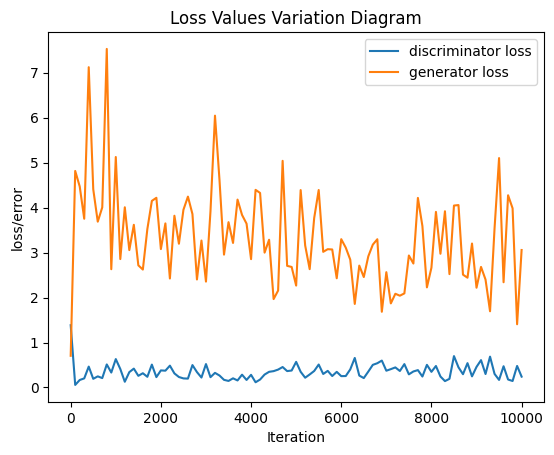

In [ ]:
############################# TODO #############################
# Here, you should use the "G_losses", and "D_losses" in order to plot the "Loss Values Variation Diagram".

# YOUR CODE STARTS HERE

plt.plot(range(0, iter_max+1, 100), D_losses[::100], label="discriminator loss")
plt.plot(range(0, iter_max+1, 100), G_losses[::100], label="generator loss")
plt.ylabel("loss/error")
plt.xlabel('Iteration')
plt.title("Loss Values Variation Diagram")
plt.legend()
plt.show()

# YOUR CODE ENDS HERE

## **Plot FID values**

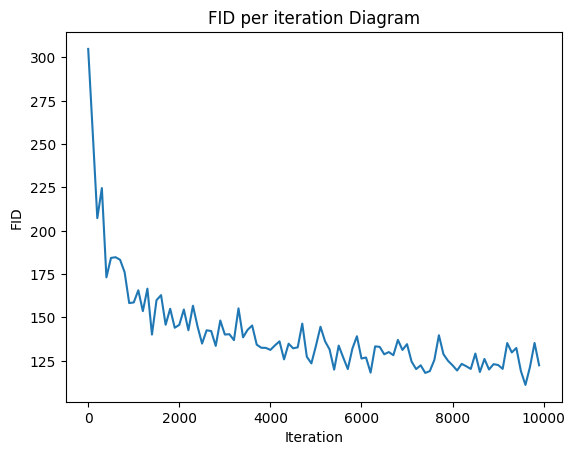

In [ ]:
plt.plot(range(0, iter_max, 100), fid_values)
plt.ylabel("FID")
plt.xlabel('Iteration')
plt.title("FID per iteration Diagram")
plt.show()

## **Visualization:**

By using the "img_list" you can visualize the animation of changes that occurred during training.

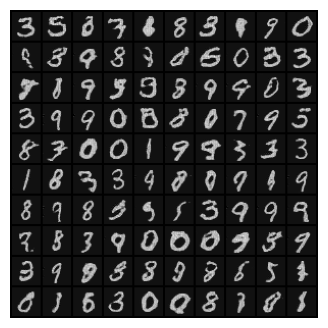

In [ ]:
import matplotlib.animation as animation
from IPython.display import HTML

fig = plt.figure(figsize=(4, 4))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i.detach().cpu(), (1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [ ]:
n = len(img_list)

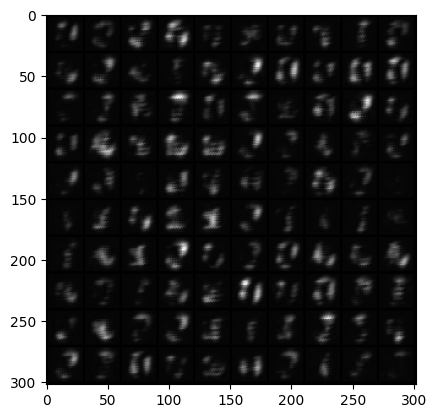

In [ ]:
plt.imshow(np.transpose(img_list[2].detach().cpu(), (1,2,0)), animated=True)

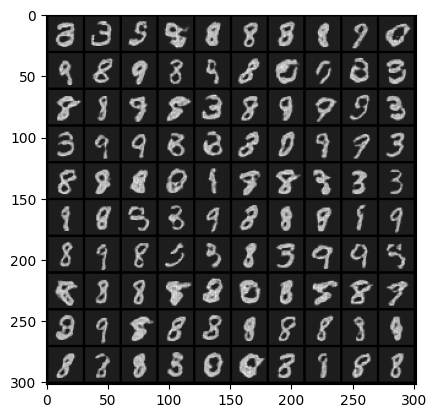

In [ ]:
plt.imshow(np.transpose(img_list[n//2].detach().cpu(), (1,2,0)), animated=True)

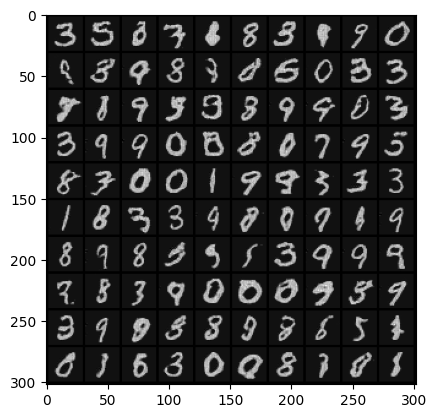

In [ ]:
plt.imshow(np.transpose(img_list[-1].detach().cpu(), (1,2,0)), animated=True)